In [365]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


In [333]:
#https://github.com/MushroomObserver/mushroom-observer/blob/main/README_API.md#csv-files
#downloaded observations, locations, and classifications
#created regions
#Combination of EXCEL and SQL to clean/sort/organize into new spreadsheet: mushquery.csv

Import SQL query resultset : mushquery.csv

Kingdom = Fungi

Date range >= 1990-01-01

Country = USA


In [334]:
df = pd.read_csv('../data/mushquery.csv')
#df.info()
df.head()

,id,name_id,date,location_id,lat,long,name_id-2,domain,kingdom,phylum,class,order,family,state,region,location_lat,location_long
0,488305,63622,1990-03-10,1436,999.0,999.0,63622,Eukarya,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Galeropsidaceae,OR,WEST,44.56300,-123.28350
1,518156,3683,1990-06-21,24157,999.0,999.0,3683,Eukarya,Fungi,Ascomycota,Leotiomycetes,Pezizales,Sarcoscyphaceae,MN,MIDWEST,45.02525,-93.61570
2,518163,3599,1990-06-28,24157,999.0,999.0,3599,Eukarya,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Physalacriaceae,MN,MIDWEST,45.02525,-93.61570
3,448480,281,1990-07-04,24157,999.0,999.0,281,Eukarya,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Crepidotaceae,MN,MIDWEST,45.02525,-93.61570
4,31341,43745,1990-07-15,789,999.0,999.0,43745,Eukarya,Fungi,Basidiomycota,Agaricomycetes,Agaricales,Amanitaceae,OH,MIDWEST,40.64390,-80.56065


In [335]:
#fix date, from obj to date
df['date']=pd.to_datetime(df['date'])

#Separate out into decades
df_90s = df[df['date'].between('1990-01-01', '1999-12-31')]
#df_90s

In [336]:
df_2000s = df[df['date'].between('2000-01-01', '2009-12-31')]
#df_2000s

In [337]:
df_2010s = df[df['date'].between('2010-01-01', '2019-12-31')]
#df_2010s

Total number of observations per decade?

In [338]:
df_90s['id'].count()

675

In [339]:
df_2000s['id'].count()

21453

In [340]:
df_2010s['id'].count()

195993

What is the average number of observations per year?    


In [341]:
#count of observations per year
#group observations by year
#use mean
obs_py_90s = df_90s.groupby(df_90s['date'].dt.year).size()
obs_py_90s.mean()
#67.5 average observations per year for date range 1990-1999

67.5

In [342]:
#HUGE spike in 2006 - and every year after  
#surely not a coincidence, website established in 07/2006 per https://smallseotools.com/domain-age-checker/
obs_py_2000s = df_2000s.groupby(df_2000s['date'].dt.year).size()
obs_py_2000s.mean()
#2145.3 average observations per year for date range 2000-2009
#remove .mean() to see breakdown per year

2145.3

In [343]:
#This is a good one to graph - there's up and down .. 
#would be interesting to see the average observations for 2020 due to pandemic

obs_py_2010s = df_2010s.groupby(df_2010s['date'].dt.year).size()
obs_py_2010s.mean()
#19599.3 average observations per year for date range 2010-2019

19599.3

In [344]:
#just for kicks, include 2020 - increase of 330 observations from 2019, not too outragous
new_obs_py_2010s = pd.concat([df_2010s, df_test])
new_2010s = new_obs_py_2010s.groupby(new_obs_py_2010s['date'].dt.year).size()
new_2010s

date
2010    10756
2011    14228
2012    17057
2013    17416
2014    20127
2015    17097
2016    20373
2017    22598
2018    31350
2019    24991
2020    25321
dtype: int64

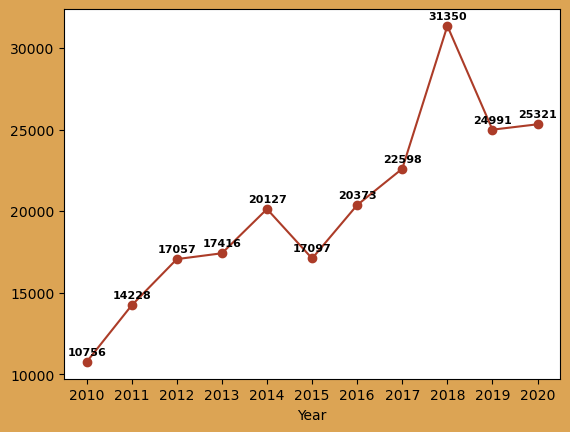

In [345]:
date = ['2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020']
observations = [10756,14228,17057,17416,20127,17097,20373,22598,31350,24991,25321]
fig= plt.figure(facecolor='#DCA454')
plt.plot(date,observations, color = "#AC3C28", marker='o')
plt.xlabel('Year')
#add annotations to show values per year?
#https://queirozf.com/entries/add-labels-and-text-to-matplotlib-plots-annotation-examples but instead of label use str
for x,y in zip(date,observations):
    plt.annotate(str(y),(x,y),textcoords="offset points", xytext=(0,5),ha='center',fontsize=8, fontweight='bold')
plt.show()
#get feed back on if 2020 should be excluded or not since you're not really using it elsewhere
#seems that based on the trend its worth looking into 2015 and 2018
#check and see if those years had drastically different weather or not, and narrow down where the mushrooms were reported

Which states have the highest count of mushrooms/ per decade?

In [346]:
df_90s[['kingdom','state']].value_counts().head()
#Minnesota, California, Pennsylvania, Ohio, Conneticut

kingdom  state
Fungi    MN       212
         CA       168
         PA        83
         OH        37
         CT        28
dtype: int64

In [347]:
df_2000s[['kingdom','state']].value_counts().head()
#California, Oregon, Ohio,Pennsylvania,West Virginia

kingdom  state
Fungi    CA       10795
         OR        2143
         OH        1195
         PA         905
         WV         772
dtype: int64

In [348]:
df_2010s[['kingdom','state']].value_counts().head()
#California, Pennsylvania,Washington, Oregon, Georgia

kingdom  state
Fungi    CA       42320
         PA       18236
         WA       15019
         OR       10575
         GA        8549
dtype: int64

What are the top five most popular mushrooms per Region?

In [349]:
df_90s[['region','family']].value_counts().head()

region     family      
MIDWEST    Unknown         35
NORTHEAST  Boletaceae      29
WEST       Amanitaceae     19
MIDWEST    Polyporaceae    17
WEST       Agaricaceae     17
dtype: int64

In [350]:
df_2000s[['region','family']].value_counts().head()

region  family     
WEST    Russulaceae    997
        Amanitaceae    948
        Boletaceae     742
        Unknown        714
        Agaricaceae    613
dtype: int64

In [351]:
df_2010s[['region','family']].value_counts().head()

region  family     
SOUTH   Unknown        5272
WEST    Unknown        5011
SOUTH   Amanitaceae    4632
        Boletaceae     3987
WEST    Amanitaceae    3876
dtype: int64

In [352]:
#TEST - use a small date range to figure out
df_test=df[df['date'].between('2020-01-01', '2020-12-31')]
#df_test.info()
#count specific type of mushroom per state
df_test[['state','family']].value_counts()


state  family         
CA     Unknown            304
MI     Polyporaceae       264
CA     Psathyrellaceae    221
VA     Boletaceae         213
AR     Unknown            210
                         ... 
MI     Tulasnellaceae       1
FL     Glomerellaceae       1
MI     Wynneaceae           1
PA     Sarcoscyphaceae      1
AK     Agaricaceae          1
Length: 3063, dtype: int64

In [353]:
#df['family'].value_counts - use normalize to see how frequent each value appears compared to the whole series, shows as percentage
#df_test['family'].value_counts(normalize=True)

In [354]:
#count most popular mushroom (family) by state & region for only the year 2020, to see if it matches SQL window function query
#IT DOES! it didn't match exactly at first because of the unknown's and bc of the order (had family, state, region)
df_test[['state','region','family']].value_counts().head(20)

state  region     family         
CA     WEST       Unknown            304
MI     MIDWEST    Polyporaceae       264
CA     WEST       Psathyrellaceae    221
VA     SOUTH      Boletaceae         213
AR     SOUTH      Unknown            210
MI     MIDWEST    Unknown            210
PA     NORTHEAST  Unknown            202
IN     MIDWEST    Unknown            197
WA     WEST       Unknown            191
MI     MIDWEST    Boletaceae         183
TX     SOUTH      Unknown            181
FL     SOUTH      Unknown            166
WI     MIDWEST    Unknown            165
GA     SOUTH      Unknown            147
MI     MIDWEST    Amanitaceae        145
                  Entolomataceae     142
NC     SOUTH      Amanitaceae        137
CA     WEST       Cortinariaceae     133
PA     NORTHEAST  Boletaceae         128
NJ     NORTHEAST  Boletaceae         125
dtype: int64

Overall most popular type of mushroom, excluding unknown? Use these as the images on presentation slide 2

In [355]:
#OVERALL - most popular type of mushroom (started with per region, but south and west have the same thing↓)
#SOUTH = Amanitaceae #WEST = Amanitaceae #NORTHEAST = Boletaceae #MIDWEST = Polyporaceae

#find pictures of these and put them on the front page of your presentation!
df_skip_unknown = df[df['family']!='Unknown']
df_skip_unknown[['family']].value_counts().head(5)


family         
Amanitaceae        20380
Boletaceae         18069
Russulaceae        15820
Polyporaceae       10066
Psathyrellaceae     8961
dtype: int64

In [356]:
#work on smallest df - get weather data for top 5 
#reset index to keep it as df instead of series
df_90s_popular = df_90s[['state','region','family','location_lat','location_long']].value_counts().head().reset_index()
df_90s_popular

,state,region,family,location_lat,location_long,0
0,MN,MIDWEST,Unknown,45.02525,-93.61570,13
1,MN,MIDWEST,Unknown,45.00160,-93.56760,10
2,MN,MIDWEST,Polyporaceae,45.00160,-93.56760,7
3,PA,NORTHEAST,Amanitaceae,40.16035,-79.22305,5
4,MN,MIDWEST,Hypocreaceae,45.02525,-93.61570,5


In [357]:
#above query identifies the most popular/identified mushrooms by state/region under 90s limited to top 5
#this one is for all the mushrooms documented in the 90s
df_90s_all = df_90s[['state','region','family','location_lat','location_long']]
df_90s_all

,state,region,family,location_lat,location_long
0,OR,WEST,Galeropsidaceae,44.56300,-123.28350
1,MN,MIDWEST,Sarcoscyphaceae,45.02525,-93.61570
2,MN,MIDWEST,Physalacriaceae,45.02525,-93.61570
3,MN,MIDWEST,Crepidotaceae,45.02525,-93.61570
4,OH,MIDWEST,Amanitaceae,40.64390,-80.56065
...,...,...,...,...,...
670,NH,NORTHEAST,Psathyrellaceae,42.82930,-72.05945
671,PA,NORTHEAST,Clitocybaceae,40.66625,-80.33205
672,PA,NORTHEAST,Dacryobolaceae,40.16035,-79.22305
673,PA,NORTHEAST,Agaricaceae,40.37285,-79.38560


In [358]:
#plot all mushrooms - of the 90s
df_90s_all = df_90s[['family','location_lat','location_long']]
fig = px.scatter_geo(df_90s_all, lat='location_lat', lon='location_long', hover_name='family',color='family',scope='usa')
fig.update_layout(title= 'Mushroom Observations of the 90s', title_x=0.5)
fig.show()


In [359]:
#plot the most popular mushrooms of this time frame by region -- this graph apppears incomplete/off - revisit
df_90s_popular_region = df_90s[['region','family']].value_counts().head().reset_index()
#df_90s_popular[['family','location_lat','location_long']].value_counts().head(5).reset_index()
fig = px.scatter_geo(df_90s_popular, lat='location_lat', lon='location_long', hover_name='family',color='family',scope='usa')
fig.update_layout(title= 'Most Popular Observations of the 90s', title_x=0.5)
fig.show()


In [360]:
#plot all mushrooms - of the 2000s
df_2000s_all = df_2000s[['family','location_lat','location_long']]
fig= px.scatter_geo(df_2000s_all, lat='location_lat',lon='location_long',hover_name='family',color='family',scope='usa')
fig.update_layout(title='Mushroom Observations of the 2000s',title_x=0.5)
fig.show()


In [361]:
#plot all mushrooms - of the 2010s
df_2010s_all = df_2010s[['family','location_lat','location_long']]
fig= px.scatter_geo(df_2010s_all, lat='location_lat',lon='location_long',hover_name='family',color='family',scope='usa')
fig.update_layout(title='Mushroom Observations of the 2010s',title_x=0.5)
fig.show()
#listen for feed back about the colors on 

In [366]:
#Observations reported show a dip in 2015 and a huge increase in 2018.
#compare these specific years? on a map to get an idea of the weather?

#create df for only 2015 - THIS YEAR DIPPED IN OBSERVATIONS - 3,030 LESS THAN 2014 AND 3278 LESS THAN 2016
df_2015 = df[df['date'].between('2015-01-01', '2015-12-31')]

df_2015 = df_2015[['family','location_lat','location_long']]
fig= px.scatter_geo(df_2015, lat='location_lat',lon='location_long',hover_name='family',color='family',scope='usa')
fig.update_layout(title='Mushroom Observations 2015',title_x=0.5)
fig.show()
# anticipate feed back regarding colors

In [369]:
#create df for only 2018 - THIS YEAR SPIKED IN OBSERVATIONS: 8,752 MORE OBS THAN 2017 AND 6359 MORE OBS THAN 2019
df_2018 = df[df['date'].between('2018-01-01', '2018-12-31')]

df_2018 = df_2018[['family','location_lat','location_long']]
fig= px.scatter_geo(df_2018, lat='location_lat',lon='location_long',hover_name='family',color='family',scope='usa')
fig.update_layout(title='Mushroom Observations 2018',title_x=0.5)
fig.show()

In [370]:
#Considering the difference in observations between 2014 (20,127) and 2016 (20,375) is only 248 observations...
#Did these years have similar weather?